In [0]:
import os

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
os.chdir('/content/drive/My Drive/fastai/data/birds')

In [0]:
from fastai.vision import *

from fastai import *

In [0]:
folder = '/content/drive/My Drive/fastai/data/birds/ducks'
file = '/content/drive/My Drive/fastai/data/birds/ducks/ducks.csv'

In [11]:
!ls '/content/drive/My Drive/fastai/data/birds'

ducks


In [0]:
folder = '/content/drive/My Drive/fastai/data/birds/goose'
file = '/content/drive/My Drive/fastai/data/birds/goose/goose.csv'

In [0]:
folder = '/content/drive/My Drive/fastai/data/birds/swan'
file = '/content/drive/My Drive/fastai/data/birds/swan/swan.csv'

In [0]:
os.chdir('/content/drive/My Drive/fastai/data/birds/swan')

In [0]:
path = Path('/content/drive/My Drive/fastai/data/birds')
dest = path/folder
dest.mkdir(parents=True, exist_ok=True)

In [26]:
from google.colab import files

uploaded = files.upload()

Saving swan.csv to swan.csv


In [42]:
!ls '/content/drive/My Drive/fastai/data/birds'

ducks  goose  swan


In [23]:
!pwd

/content/drive/My Drive/fastai/data/birds/goose


In [0]:
classes = ['ducks','goose','swan']

In [0]:
download_images(path/file, dest, max_pics=200)

In [0]:
for c in classes:
    print(c)
    verify_images(path/c, delete=True, max_size=500)

In [0]:
np.random.seed(42)
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

In [8]:
data.classes

['ducks', 'goose', 'swan']

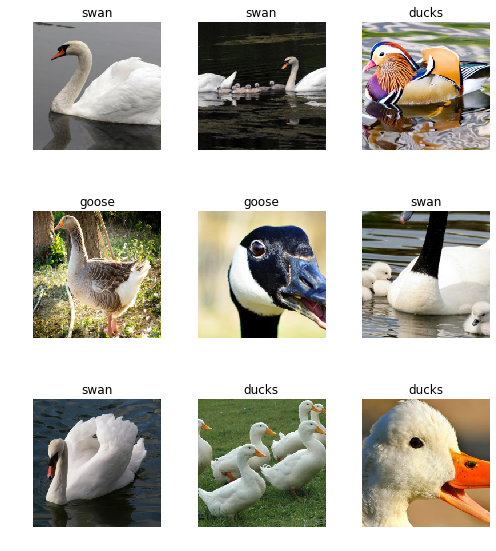

In [9]:
data.show_batch(rows=3, figsize=(7,8))

In [10]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['ducks', 'goose', 'swan'], 3, 220, 54)

In [11]:
learn = cnn_learner(data, models.resnet34, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:03<00:00, 27557879.63it/s]


In [11]:
learn.fit_one_cycle(6)

epoch,train_loss,valid_loss,error_rate,time
0,1.381342,0.986053,0.481481,00:08
1,1.026669,0.499173,0.129630,00:05
2,0.786460,0.382327,0.148148,00:05
3,0.642838,0.303984,0.111111,00:05
4,0.539202,0.277711,0.074074,00:05
5,0.466108,0.265234,0.074074,00:05


In [0]:
learn.save('stage-4')

In [0]:
learn.save('stage-1')

In [61]:
learn.load('stage-1')

Learner(data=ImageDataBunch;

Train: LabelList (225 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
ducks,ducks,ducks,ducks,ducks
Path: /content/drive/My Drive/fastai/data/birds;

Valid: LabelList (56 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
ducks,goose,swan,swan,goose
Path: /content/drive/My Drive/fastai/data/birds;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(

In [0]:
learn.unfreeze()

In [14]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


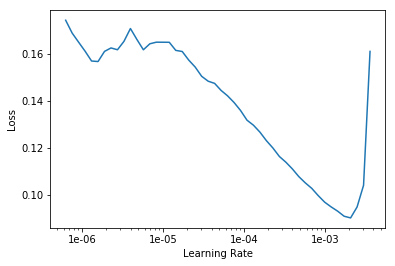

In [15]:
learn.recorder.plot()

In [16]:
learn.fit_one_cycle(3, max_lr=slice(1e-5,1e-3))

epoch,train_loss,valid_loss,error_rate,time
0,0.220696,0.229580,0.055556,00:05
1,0.194993,0.200192,0.037037,00:06
2,0.164299,0.184174,0.037037,00:05


In [0]:
learn.save('stage-6')

In [12]:
learn.load('stage-6') # only load this weight because it is giving more than 90 % accuracy

Learner(data=ImageDataBunch;

Train: LabelList (220 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
ducks,ducks,ducks,ducks,ducks
Path: /content/drive/My Drive/fastai/data/birds;

Valid: LabelList (54 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
ducks,goose,swan,goose,swan
Path: /content/drive/My Drive/fastai/data/birds;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(

In [0]:
learn.save('stage-2')

In [35]:
learn.load('stage-2')

Learner(data=ImageDataBunch;

Train: LabelList (225 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
ducks,ducks,ducks,ducks,ducks
Path: /content/drive/My Drive/fastai/data/birds;

Valid: LabelList (56 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
ducks,goose,swan,swan,goose
Path: /content/drive/My Drive/fastai/data/birds;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

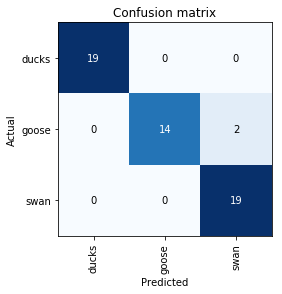

In [19]:
interp.plot_confusion_matrix()

In [0]:
learn.export()

In [0]:
from fastai.widgets import *

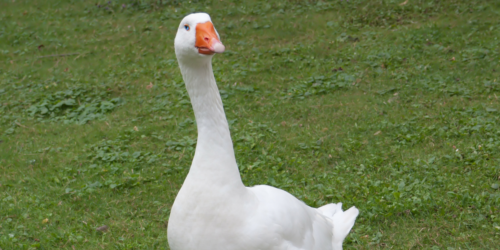

In [22]:
img = open_image(path/'goose'/'00000003.png')
img

In [0]:
db = (ImageList.from_folder(path)
                   .split_none()
                   .label_from_folder()
                   .transform(get_transforms(), size=224)
                   .databunch()
     )

In [0]:
learn = load_learner(path)

In [24]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category goose

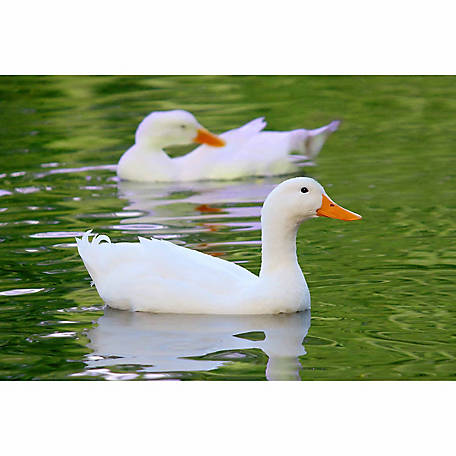

In [27]:
img1 = open_image(path/'ducks'/'00000005.jpg')
img1

In [28]:
pred_class,pred_idx,outputs = learn.predict(img1)
pred_class

Category ducks

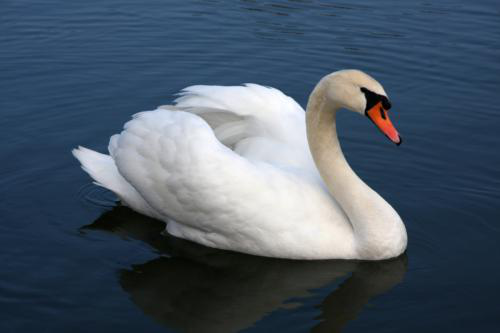

In [13]:
img2 = open_image(path/'swan'/'00000003.jpg')
img2

In [14]:
pred_class,pred_idx,outputs = learn.predict(img2)
pred_class

Category swan

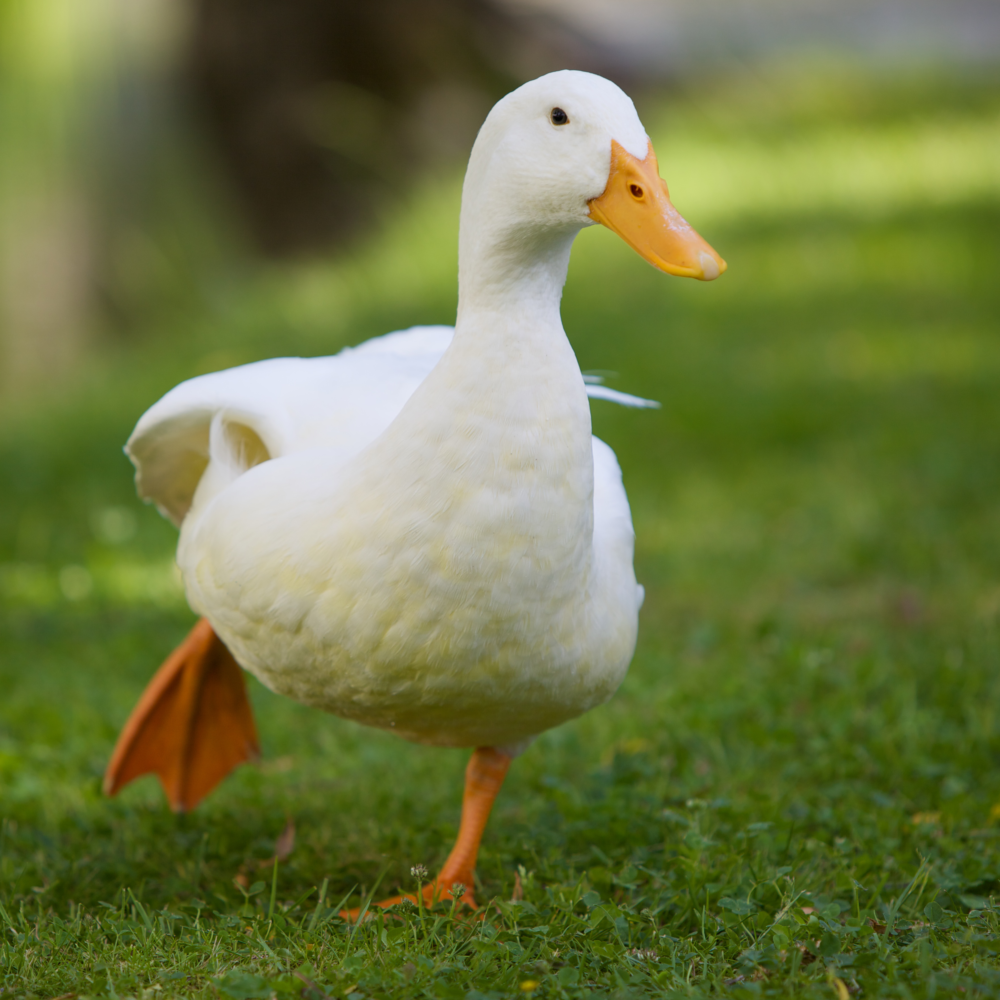

In [15]:
img3 = open_image(path/'Test'/'duck-05.jpg')
img3

In [16]:
pred_class,pred_idx,outputs = learn.predict(img3)
pred_class

Category ducks

In [0]:
# If you already cleaned your data using indexes from `from_toplosses`,
# run this cell instead of the one before to proceed with removing duplicates.
# Otherwise all the results of the previous step would be overwritten by
# the new run of `ImageCleaner`.

# db = (ImageList.from_csv(path, 'cleaned.csv', folder='.')
#                    .no_split()
#                    .label_from_df()
#                    .transform(get_transforms(), size=224)
#                    .databunch()
#      )

In [0]:
learn_cln = cnn_learner(db, models.resnet34, metrics=error_rate)

learn_cln.load('stage-2');

In [0]:
ds, idxs = DatasetFormatter().from_toplosses(learn_cln)

In [22]:
ds, idxs = DatasetFormatter().from_similars(learn_cln)

Getting activations...


Computing similarities...


In [0]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,error_rate,time


Exception ignored in: <bound method _DataLoaderIter.__del__ of <torch.utils.data.dataloader._DataLoaderIter object at 0x7fa9dd63d470>>
Exception ignored in: <bound method _DataLoaderIter.__del__ of <torch.utils.data.dataloader._DataLoaderIter object at 0x7fa9dd63d470>>
Exception ignored in: <bound method _DataLoaderIter.__del__ of <torch.utils.data.dataloader._DataLoaderIter object at 0x7fa9dd63d470>>
